In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# import os
import numpy as np
import pandas as pd
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2025-12-03 10:22:24.729529: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764737544.789804    8648 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764737544.807626    8648 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764737544.943109    8648 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764737544.943137    8648 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764737544.943139    8648 computation_placer.cc:177] computation placer alr

TensorFlow: 2.19.0
Num GPUs Available:  1


In [3]:
PATH = "dataset/"
df = pd.read_csv(PATH + "/train.csv")
pivot_df = df.pivot_table(index='image_path', columns='target_name', values='target').reset_index()

target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']
pivot_df = pivot_df[['image_path'] + target_cols]

# train_df, val_df = train_test_split(pivot_df, test_size=0.15, random_state=42)

In [4]:
def normalize(y):
    return tf.math.log1p(y)

def denormalize(y):
    return tf.math.expm1(y)


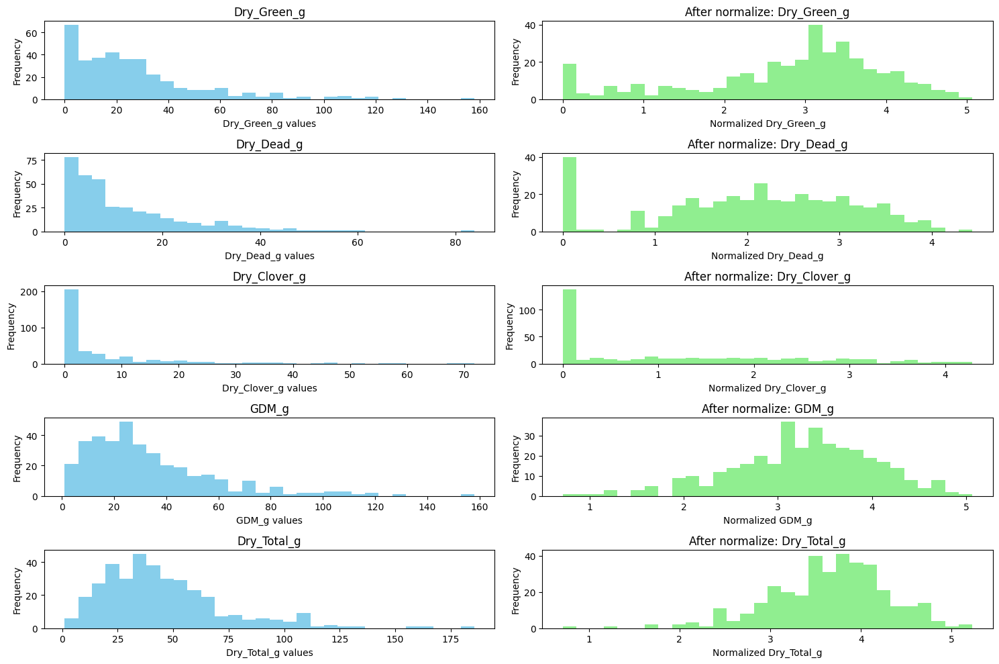

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

x_norm = np.log1p(pivot_df[target_cols])

# Plot histograms for each feature before and after normalization
plt.figure(figsize=(15,10))

for i, col in enumerate(target_cols):
    plt.subplot(5, 2, 2*i + 1)
    plt.hist(pivot_df[col], bins=30, color='skyblue')
    plt.title(f"{col}")
    plt.xlabel(f"{col} values")
    plt.ylabel("Frequency")

    plt.subplot(5, 2, 2*i + 2)
    plt.hist(x_norm[col], bins=30, color='lightgreen')
    plt.title(f"After normalize: {col}")
    plt.xlabel(f"Normalized {col}")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


In [6]:
IMG_SIZE = 768

import tensorflow as tf

# LAB conversion helper
def rgb_to_lab(image):
    # Convert RGB to XYZ
    rgb = image

    # sRGB to linear RGB
    mask = tf.cast(rgb > 0.04045, tf.float32)
    linear_rgb = (rgb / 12.92) * (1 - mask) + tf.pow((rgb + 0.055) / 1.055, 2.4) * mask

    # RGB → XYZ matrix
    M = tf.constant([[0.412453, 0.357580, 0.180423],
                     [0.212671, 0.715160, 0.072169],
                     [0.019334, 0.119193, 0.950227]], tf.float32)

    xyz = tf.tensordot(linear_rgb, M, axes=1)

    # Normalize for D65 white point
    xyz_norm = xyz / tf.constant([0.95047, 1.00000, 1.08883])

    # XYZ → LAB
    epsilon = 0.008856
    kappa   = 903.3

    def f(t):
        return tf.where(t > epsilon, tf.pow(t, 1/3), (kappa * t + 16) / 116)

    f_xyz = f(xyz_norm)

    L = 116 * f_xyz[...,1] - 16
    a = 500 * (f_xyz[...,0] - f_xyz[...,1])
    b = 200 * (f_xyz[...,1] - f_xyz[...,2])

    # Normalize LAB to [0,1]
    L = L / 100.0
    a = (a + 128) / 255.0
    b = (b + 128) / 255.0

    lab = tf.stack([L, a, b], axis=-1)
    return lab


def load_image(path):
    # Read and resize
    img = tf.io.read_file(PATH + "/" + path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32) / 255.0      # RGB (3)

    # --- COLOR SPACES ---
    hsv = tf.image.rgb_to_hsv(img)              # HSV (3)
    lab = rgb_to_lab(img)                       # LAB (3)

    # --- VEGETATION INDICES ---
    r, g, b = img[...,0], img[...,1], img[...,2]

    exg = 2*g - r - b
    exg = tf.expand_dims(exg, -1)

    vari = (g - r) / (g + r - b + 1e-6)
    vari = tf.expand_dims(vari, -1)

    # ---- STACK EVERYTHING (11 channels) ----
    out = tf.concat([img, hsv, lab, exg, vari], axis=-1)

    # ---- CLEAN BAD VALUES ----
    out = tf.where(tf.math.is_nan(out), 0.0, out)
    out = tf.where(tf.math.is_inf(out), 0.0, out)

    return out


Plotting: train/ID853954911.jpg


I0000 00:00:1764737555.760650    8648 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5535 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


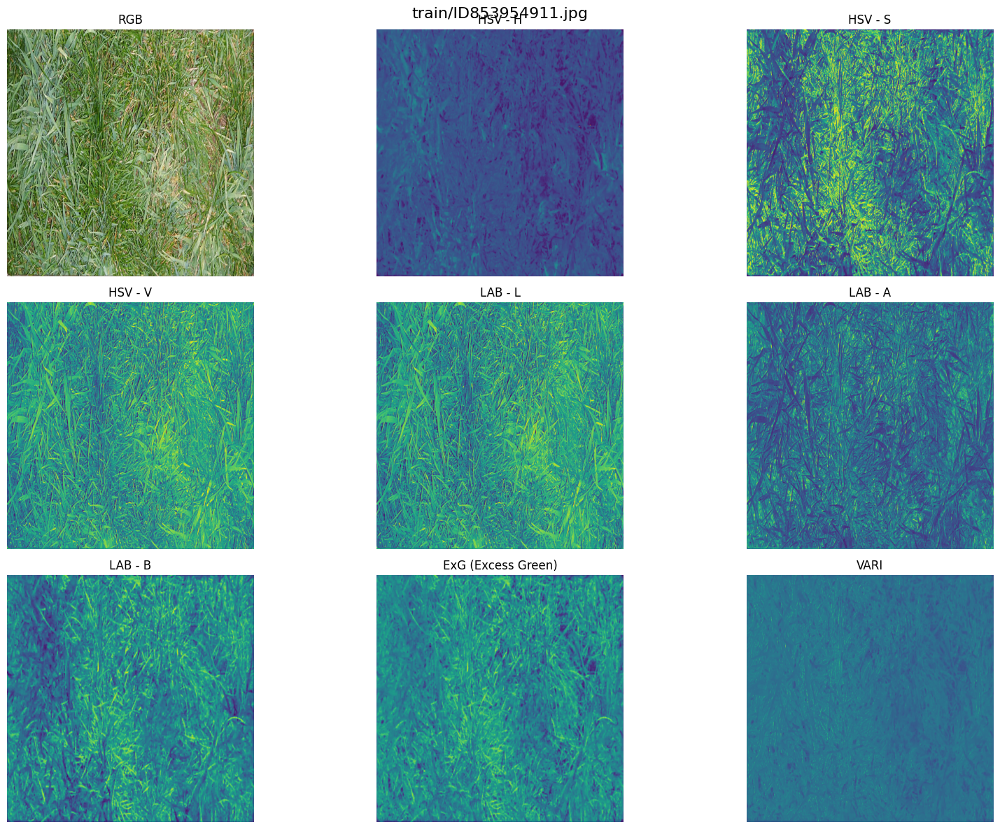

Plotting: train/ID1343327476.jpg


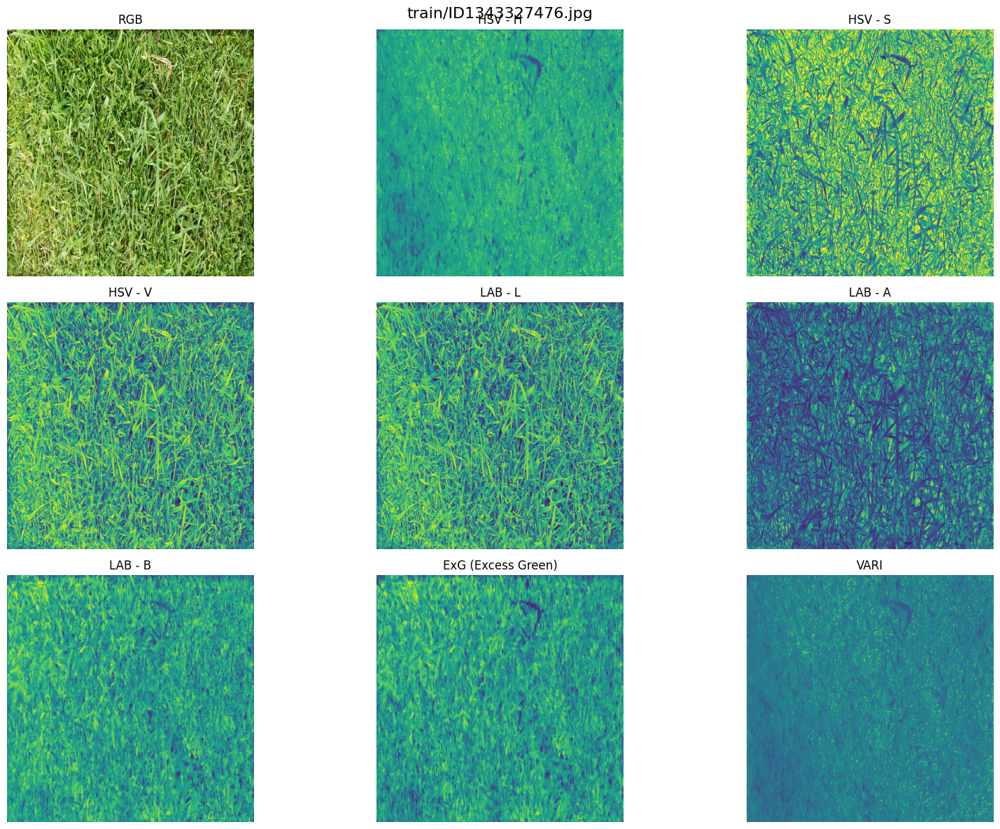

Plotting: train/ID1717006117.jpg


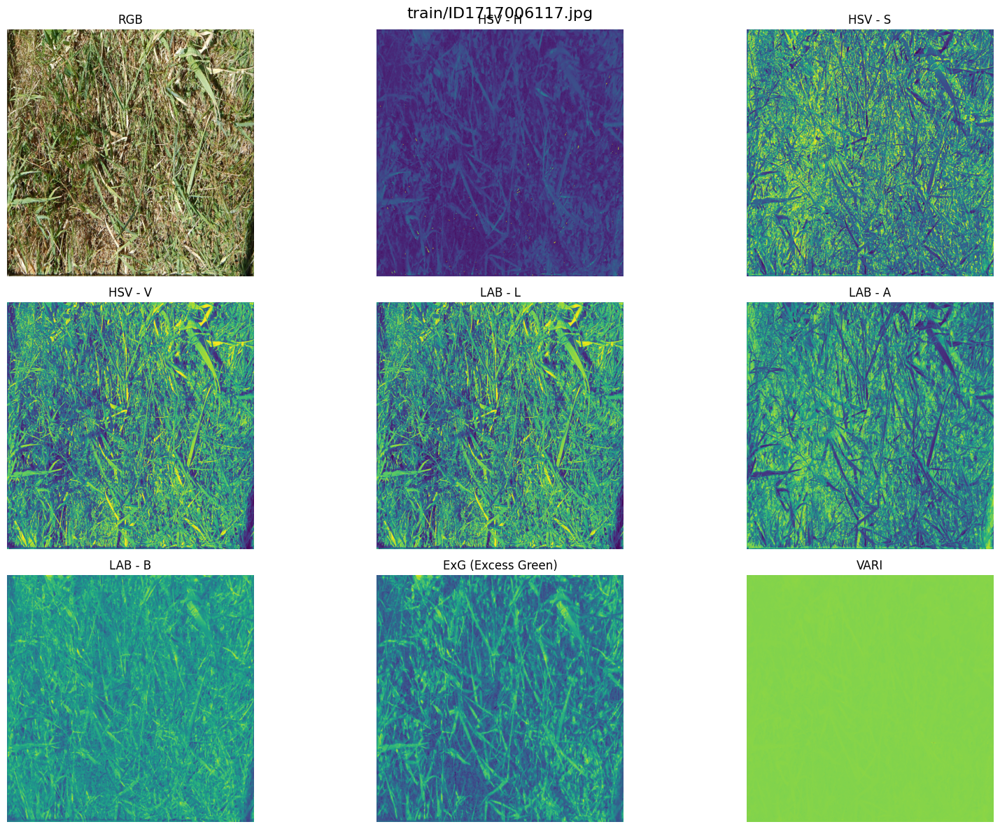

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

N_SAMPLES = 3  # choose how many images to preview
sample_paths = pivot_df['image_path'].sample(N_SAMPLES).tolist()


def plot_features(img_tensor, title=""):
    """
    img_tensor: output of load_image() → shape (H, W, 11)
    """

    img = img_tensor.numpy()

    # Extract channels (matching load_image)
    RGB  = img[..., :3]

    HSV  = img[..., 3:6]
    LAB  = img[..., 6:9]

    EXG  = img[..., 9]
    VARI = img[..., 10]

    # order matters for visual clarity
    feature_maps = [
        ("RGB", RGB),

        ("HSV - H", HSV[...,0]),
        ("HSV - S", HSV[...,1]),
        ("HSV - V", HSV[...,2]),

        ("LAB - L", LAB[...,0]),
        ("LAB - A", LAB[...,1]),
        ("LAB - B", LAB[...,2]),

        ("ExG (Excess Green)", EXG),
        ("VARI", VARI),
    ]

    plt.figure(figsize=(16, 20))
    plt.suptitle(title, fontsize=16)

    for i, (name, channel) in enumerate(feature_maps, 1):
        plt.subplot(5, 3, i)

        if channel.ndim == 3:     # RGB
            plt.imshow(channel)
        else:
            plt.imshow(channel, cmap="viridis")

        plt.title(name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# ---- RUN VISUALIZATION ----
for path in sample_paths:
    print("Plotting:", path)
    img_tensor = load_image(path)
    plot_features(img_tensor, title=path)


In [19]:
# =============================
#  Dataset Pipeline – Final
# =============================

IMG_SIZE = 768
BATCH_SIZE = 2

# Normalization function (log1p)
def normalize_targets(y):
    return tf.math.log1p(y)

def create_dataset(dataframe, batch_size=BATCH_SIZE, shuffle=False):
    # Ensure image paths are strings
    image_paths = dataframe['image_path'].astype(str).values

    # Extract raw targets (already pivoted)
    targets = dataframe[target_cols].values.astype(np.float32)

    # Create TF dataset
    ds = tf.data.Dataset.from_tensor_slices((image_paths, targets))

    # Mapping: image features + normalized targets
    def map_func(path, target):
        img = load_image(path)             # 11-channel feature extraction
        y   = normalize_targets(target)    # apply log1p normalization
        return img, y

    ds = ds.map(map_func, num_parallel_calls=tf.data.AUTOTUNE)

    # Shuffle only for training
    if shuffle:
        ds = ds.shuffle(buffer_size=len(dataframe), reshuffle_each_iteration=True)

    # Batch + prefetch for performance
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return ds


# =============================
#  Train / Validation Split
# =============================
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    pivot_df,
    test_size=0.15,
    random_state=42,
)

train_ds = create_dataset(train_df, shuffle=True)
val_ds   = create_dataset(val_df, shuffle=False)

train_ds, val_ds


(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 768, 768, 11), dtype=tf.float32, name=None), TensorSpec(shape=(None, 5), dtype=tf.float32, name=None))>)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(18, 5))

for images, targets in train_ds.take(1):
    for i in range(3):  # show 5 images
        ax = plt.subplot(1, 5, i + 1)
        
        # Convert ONLY RGB channels for display
        rgb = images[i][..., :3].numpy()
        plt.imshow(rgb)
        
        # Targets (currently normalized via log1p)
        t = targets[i].numpy()
        
        # OPTIONAL: convert back to original biomass values
        # Uncomment if you want actual grams:
        # t = np.expm1(t)
        
        # Create title string
        title_str = "\n".join([f"{n}: {v:.2f}" for n, v in zip(target_cols, t)])
        
        plt.title(title_str, fontsize=7)
        plt.axis("off")

plt.tight_layout()
plt.show()


2025-12-03 10:27:51.346767: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] ShuffleDatasetV3:15: Filling up shuffle buffer (this may take a while): 110 of 303
2025-12-03 10:28:01.442528: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] ShuffleDatasetV3:15: Filling up shuffle buffer (this may take a while): 173 of 303


In [ ]:
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras import layers, Model, Input

def build_model(input_shape=(768, 768, 11), n_outputs=5):
    inp = Input(shape=input_shape)


    x = layers.Conv2D(96, 4, strides=4, padding="same",name="custom_stem_conv")(inp)

    base = ConvNeXtTiny(include_top=False, weights="imagenet")

    backbone_input = x

    for layer in base.layers[3:]:
        backbone_input = layer(backbone_input)

    x = backbone_input

    x = layers.GlobalAveragePooling2D()(x)


    x = layers.Dense(1024, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(512, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.1)(x)

    out = layers.Dense(n_outputs, activation="linear")(x)

    model = Model(inp, out, name="ConvNeXt_11ch_5out")

    return model


model = build_model()
model.summary()


Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 29,309,349 (111.81 MB)

 Trainable params: 29,309,349 (111.81 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Freeze all ConvNeXt layers (only train custom stem + head)
for layer in model.layers:
    if "convnext" in layer.name:   # all ConvNeXt layers
        layer.trainable = False

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 29,309,349 (111.81 MB)

 Trainable params: 1,495,653 (5.71 MB)

 Non-trainable params: 27,813,696 (106.10 MB)

In [ ]:
import tensorflow as tf
import tensorflow.keras.backend as K

# # Weighted R2 metric
# def weighted_r2(y_true, y_pred):
#     weights = tf.constant([0.1, 0.1, 0.1, 0.2, 0.5], dtype=tf.float32)
#     mean_y_true = K.mean(y_true, axis=0)
#     tss = K.sum(K.square(y_true - mean_y_true), axis=0)
#     rss = K.sum(K.square(y_true - y_pred), axis=0)
#     r2_scores = 1 - rss / (tss + K.epsilon())
#     return K.sum(r2_scores * weights)

# Per-target MAEs
def mae_0(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,0] - y_pred[:,0]))
def mae_1(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,1] - y_pred[:,1]))
def mae_2(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,2] - y_pred[:,2]))
def mae_3(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,3] - y_pred[:,3]))
def mae_4(y_true, y_pred): return tf.reduce_mean(tf.abs(y_true[:,4] - y_pred[:,4]))

In [ ]:
optimizer_warmup = tf.keras.optimizers.Adam(
    learning_rate=3e-5,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_warmup,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4]
    # metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [ ]:
history_warmup = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,
    verbose=1
)


Epoch 1/3


I0000 00:00:1764737648.384448    8886 service.cc:152] XLA service 0x7586000042c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764737648.384477    8886 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-12-03 10:24:08.743291: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1764737650.318571    8886 cuda_dnn.cc:529] Loaded cuDNN version 91002
2025-12-03 10:24:13.017416: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot', 188 bytes spill stores, 188 bytes spill loads

2025-12-03 10:24:13.019249: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_d

  1/101 ━━━━━━━━━━━━━━━━━━━━ 1:01:25 37s/step - loss: 2.0242 - mae: 2.4766 - mae_0: 1.3484 - mae_1: 1.6978 - mae_2: 2.2233 - mae_3: 3.8343 - mae_4: 3.2795

I0000 00:00:1764737671.009714    8886 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


101/101 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 1.6328 - mae: 2.0919 - mae_0: 1.6923 - mae_1: 1.8813 - mae_2: 1.1546 - mae_3: 3.2449 - mae_4: 2.4864

2025-12-03 10:24:53.719334: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_3329', 424 bytes spill stores, 544 bytes spill loads

2025-12-03 10:24:53.726130: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_3329', 212 bytes spill stores, 244 bytes spill loads

2025-12-03 10:24:53.739471: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_3329', 380 bytes spill stores, 380 bytes spill loads

2025-12-03 10:24:53.957902: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_3329_0', 204 bytes spill stores, 400 bytes spill loads

2025-12-03 10:24:54.005886: I 

101/101 ━━━━━━━━━━━━━━━━━━━━ 64s 276ms/step - loss: 1.1518 - mae: 1.5865 - mae_0: 1.3686 - mae_1: 1.5555 - mae_2: 1.1063 - mae_3: 2.2640 - mae_4: 1.6381 - val_loss: 0.4756 - val_mae: 0.8669 - val_mae_0: 1.0209 - val_mae_1: 0.9559 - val_mae_2: 1.2333 - val_mae_3: 0.6222 - val_mae_4: 0.5021
Epoch 2/3


2025-12-03 10:25:11.997069: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] ShuffleDatasetV3:2: Filling up shuffle buffer (this may take a while): 281 of 303
2025-12-03 10:25:13.140240: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:482] Shuffle buffer filled.


101/101 ━━━━━━━━━━━━━━━━━━━━ 37s 219ms/step - loss: 0.5188 - mae: 0.9067 - mae_0: 1.0268 - mae_1: 0.9679 - mae_2: 1.0960 - mae_3: 0.7223 - mae_4: 0.7206 - val_loss: 0.4610 - val_mae: 0.8516 - val_mae_0: 0.9756 - val_mae_1: 0.9259 - val_mae_2: 1.2369 - val_mae_3: 0.5924 - val_mae_4: 0.5270
Epoch 3/3


2025-12-03 10:25:46.249112: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] ShuffleDatasetV3:2: Filling up shuffle buffer (this may take a while): 269 of 303
2025-12-03 10:25:47.395608: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:482] Shuffle buffer filled.
2025-12-03 10:25:47.413831: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 77856828 bytes after encountering the first element of size 77856828 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


101/101 ━━━━━━━━━━━━━━━━━━━━ 33s 208ms/step - loss: 0.5222 - mae: 0.9053 - mae_0: 1.0130 - mae_1: 0.9909 - mae_2: 1.1653 - mae_3: 0.6618 - mae_4: 0.6954 - val_loss: 0.4315 - val_mae: 0.7996 - val_mae_0: 0.9142 - val_mae_1: 0.9013 - val_mae_2: 1.2201 - val_mae_3: 0.4957 - val_mae_4: 0.4666


In [ ]:
# Unfreeze everything
for layer in model.layers:
    layer.trainable = True

model.summary()

Model: "ConvNeXt_11ch_5out"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 768, 768, 11)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_stem_conv (Conv2D)       │ (None, 192, 192, 96)   │        16,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_0_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │           192 │
│ (LayerNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │        37,248 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 384)  │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │        36,960 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │            96 │
│ (LayerScale)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_1_… │ (None, 192, 192, 96)   │             0 │
│ (Activation)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny_stage_0_block_2_… │ (None, 192, 192, 96)   │         4,800 │
│ (Conv2D)                        │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 32,300,657 (123.22 MB)

 Trainable params: 29,309,349 (111.81 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,991,308 (11.41 MB)

In [ ]:
optimizer_full = tf.keras.optimizers.Adam(
    learning_rate=5e-6,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer_full,
    loss=tf.keras.losses.Huber(delta=1.0),
    metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4,]
    # metrics=["mae", mae_0, mae_1, mae_2, mae_3, mae_4, weighted_r2]
)


In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'feature_best_model.keras',
    monitor='val_weighted_r2',
    mode='max',
    save_best_only=True,
    verbose=1
)

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_weighted_r2',
    mode='max',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_weighted_r2',
    mode='max',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)


In [ ]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=1,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


2025-12-03 10:26:48.040605: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_143', 4 bytes spill stores, 4 bytes spill loads

2025-12-03 10:26:50.249414: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-03 10:26:50.334370: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-03 10:26:50.548044: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-12-03 10:26:50.631881: E external/local_xla/xla/strea

ResourceExhaustedError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/kernelapp.py", line 739, in start

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/tornado/platform/asyncio.py", line 211, in start

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/asyncio/base_events.py", line 645, in run_forever

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/asyncio/base_events.py", line 1999, in _run_once

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/asyncio/events.py", line 88, in _run

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 519, in dispatch_queue

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 508, in process_one

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 400, in dispatch_shell

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 368, in execute_request

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/kernelbase.py", line 767, in execute_request

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 455, in do_execute

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/ipykernel/zmqshell.py", line 577, in run_cell

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3116, in run_cell

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3171, in _run_cell

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3394, in run_cell_async

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3639, in run_ast_nodes

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/IPython/core/interactiveshell.py", line 3699, in run_code

  File "/tmp/ipykernel_8648/762299851.py", line 1, in <module>

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 377, in fit

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 220, in function

  File "/home/vector/anaconda3/envs/gpu/lib/python3.12/site-packages/keras/src/backend/tensorflow/trainer.py", line 133, in multi_step_on_iterator

Out of memory while trying to allocate 5107297200 bytes.
	 [[{{node StatefulPartitionedCall}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_multi_step_on_iterator_76749]

In [ ]:
history_full = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint, reduce_lr],
    # callbacks=[checkpoint, reduce_lr, early_stopping],
    verbose=1
)


In [ ]:
import matplotlib.pyplot as plt

def plot_pretty(history):
    h = history.history
    epochs = range(1, len(h['loss']) + 1)

    plt.figure(figsize=(20, 16))

    # -------------------------------
    # 1. LOSS (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 1)
    plt.plot(epochs, h['loss'], label='loss')
    plt.plot(epochs, h['val_loss'], label='val_loss')
    plt.title("Loss (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 2. MAE (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 2)
    plt.plot(epochs, h['mae'], label='mae')
    plt.plot(epochs, h['val_mae'], label='val_mae')
    plt.title("MAE (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 3. Per-Component MAE
    # -------------------------------
    plt.subplot(3, 2, 3)
    for i in range(5):
        plt.plot(epochs, h[f'mae_{i}'], label=f'mae_{i}')
        plt.plot(epochs, h[f'val_mae_{i}'], '--', label=f'val_mae_{i}')
    plt.title("Per-Component MAE (Train & Val)")
    plt.xlabel("Epoch")
    plt.ylabel("MAE")
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=8, ncol=2)

    # -------------------------------
    # 4. Weighted R2 (Train vs Val)
    # -------------------------------
    plt.subplot(3, 2, 4)
    plt.plot(epochs, h['weighted_r2'], label='weighted_r2')
    plt.plot(epochs, h['val_weighted_r2'], label='val_weighted_r2')
    plt.title("Weighted R² (Train vs Val)")
    plt.xlabel("Epoch")
    plt.ylabel("R²")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # -------------------------------
    # 5. Learning Rate Schedule
    # -------------------------------
    if 'learning_rate' in h:
        plt.subplot(3, 2, 5)
        plt.plot(epochs, h['learning_rate'], label='learning_rate', color='purple')
        plt.title("Learning Rate Schedule")
        plt.xlabel("Epoch")
        plt.ylabel("LR")
        plt.grid(True, alpha=0.3)
        plt.legend()

    plt.tight_layout()
    plt.show()
plot_pretty(history_full)

In [ ]:
from tensorflow.keras.models import save_model
save_model(model, "model9_v2.keras", save_format="keras")

In [ ]:
# from tensorflow.keras.models import load_model

# model = load_model(
#     "/home/vector/project/CSIRO---Image2Biomass-Prediction/model9.keras",
#     custom_objects={
#         "weighted_r2": weighted_r2,
#         "mae_0": mae_0,
#         "mae_1": mae_1,
#         "mae_2": mae_2,
#         "mae_3": mae_3,
#         "mae_4": mae_4,
#     }
# )

# print("Model loaded successfully!")


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def denormalize(y):
    return tf.math.expm1(y)

def evaluate_and_visualize_rgb(model, val_ds, num_samples=4):
    all_images = []
    all_targets = []
    all_preds = []

    print("Collecting predictions...")
    for images, targets in val_ds:
        preds = model.predict(images, verbose=0)

        # Convert tensors to numpy
        images = images.numpy()
        targets = targets.numpy()
        preds = preds

        # Keep RGB only
        images = images[..., :3]
        images = np.clip(images, 0, 1)

        all_images.append(images)
        all_targets.append(targets)
        all_preds.append(preds)

    # Combine
    all_images = np.concatenate(all_images, axis=0)
    all_targets = np.concatenate(all_targets, axis=0)
    all_preds = np.concatenate(all_preds, axis=0)

    target_names = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']

    idxs = np.random.choice(len(all_images), num_samples, replace=False)

    for idx in idxs:
        img = all_images[idx]

        # ---- apply denormalization ----
        true = denormalize(all_targets[idx]).numpy()
        pred = denormalize(all_preds[idx]).numpy()

        plt.figure(figsize=(12,4))

        # Image
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.axis("off")
        plt.title("Input Image")

        # Table
        plt.subplot(1,2,2)
        plt.axis("off")

        text = f"{'Component':<15} | {'True':>7} | {'Pred':>7} | {'Diff':>7}\n"
        text += "-"*50 + "\n"

        for i, name in enumerate(target_names):
            diff = pred[i] - true[i]
            text += f"{name:<15} | {true[i]:7.1f} | {pred[i]:7.1f} | {diff:7.1f}\n"

        plt.text(0, 0.5, text, fontsize=12, family="monospace", va="center")
        plt.tight_layout()
        plt.show()

# run
evaluate_and_visualize_rgb(model, val_ds, num_samples=4)


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import os

print("Loading test data...")
test_df = pd.read_csv(PATH + "/test.csv")

# Get unique images to predict on
unique_images = test_df['image_path'].unique()
print(f"Found {len(unique_images)} unique test images.")

test_ds = tf.data.Dataset.from_tensor_slices(unique_images)
test_ds = test_ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


print("Predicting...")
# Predict
predictions = model.predict(test_ds, verbose=1)


target_cols = ['Dry_Green_g', 'Dry_Dead_g', 'Dry_Clover_g', 'GDM_g', 'Dry_Total_g']

# Create a lookup dictionary: image_path -> {target_name: value}
pred_dict = {}
for img_path, pred_row in zip(unique_images, denormalize(predictions).numpy()):
    pred_dict[img_path] = {col: val for col, val in zip(target_cols, pred_row)}


print("Formatting submission...")
# Create submission rows
submission_rows = []
for index, row in test_df.iterrows():
    img_path = row['image_path']
    target_name = row['target_name']
    sample_id = row['sample_id']
    
    # Get prediction
    if img_path in pred_dict:
        pred_value = pred_dict[img_path][target_name]
    else:
        # Fallback if something went wrong (shouldn't happen)
        pred_value = 0.0
    
    # Ensure non-negative (biomass can't be negative)
    pred_value = max(0.0, pred_value)
    
    submission_rows.append({'sample_id': sample_id, 'target': pred_value})
    
submission_df = pd.DataFrame(submission_rows)

# Save to CSV
output_file = "submission.csv"
submission_df.to_csv(output_file, index=False)
print(f"Saved submission to {output_file}")

# Print the content for user to copy if needed
print("\n" + "="*20 + " SUBMISSION CSV CONTENT " + "="*20)
print(submission_df.to_csv(index=False))
print("="*64)

